In [1]:
from pathlib import Path
from typing import List

import numpy as np
from IPython.display import clear_output
from PIL import Image
from tqdm import tqdm, trange
from torch.utils.data import DataLoader
from torchvision import transforms as T
from torchvision.utils import make_grid
from utils import pad_to_squarize, crop_to_squarize, paste_on_bg, experiment

Visualizing class: wing


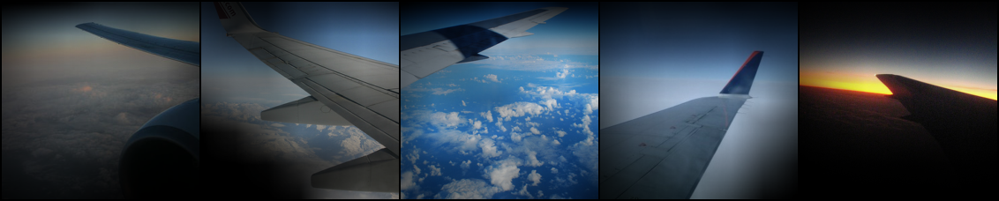

In [2]:
from salient_imagenet import SalientImageNet, MTurkResults
with open("./imagenet_classes.txt", "r") as f:
    imagenet_classes = eval(f.read())
    
mturk_results = MTurkResults()
core_features_dict = mturk_results.core_features_dict
class_idx = 908
dataset = SalientImageNet(class_idx, core_features_dict[class_idx])
dataloader = DataLoader(dataset, batch_size=5, shuffle=False)

print(f"Visualizing class: {imagenet_classes[class_idx]}")
images, masks = next(iter(dataloader))


display(T.ToPILImage()(make_grid(images[:5] * masks[:5])))

Salient ImageNet masks are too soft and include background too.

loading annotations into memory...
Done (t=19.57s)
creating index...
index created!


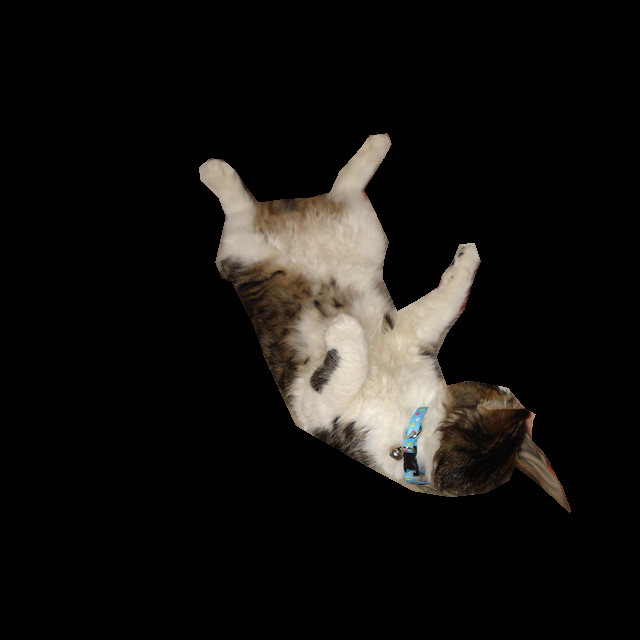

In [3]:
from coco import CocoDetection
coco = CocoDetection(mask_transform=None)
coco.cat = "cat"
image, target, mask = coco[0]
display(Image.fromarray(pad_to_squarize(mask * image)))

In [4]:
rng = np.random.default_rng()
def get_random_coco_samples(num_samples=50, image_size=512):
    images = []
    for i in range(num_samples):
        cat_name = rng.choice(coco.cat_names)
        coco.cat = cat_name
        image, _, mask = coco.get_random()
        image = Image.fromarray(pad_to_squarize(image * mask))
        image = T.Resize(image_size, interpolation=T.InterpolationMode.BICUBIC)(image)
        images.append((cat_name, image))
        
    return images

In [5]:
%%capture
from diffusion_generator import DiffusionGenerator
import logging
logging.getLogger("seed").setLevel(logging.CRITICAL)
diffusion = DiffusionGenerator()
image_transform = T.Compose([
    T.ToTensor(),
    T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])

## Background Fill (No Init Image, No Background Prompt)

In [6]:
num_samples = 50
images = get_random_coco_samples(num_samples=num_samples)
generated_images = []
for cat_name, image in tqdm(images):
    prompt = f"a photo of a {cat_name}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:48<00:00,  6.98s/it]


Class: a photo of a mouse


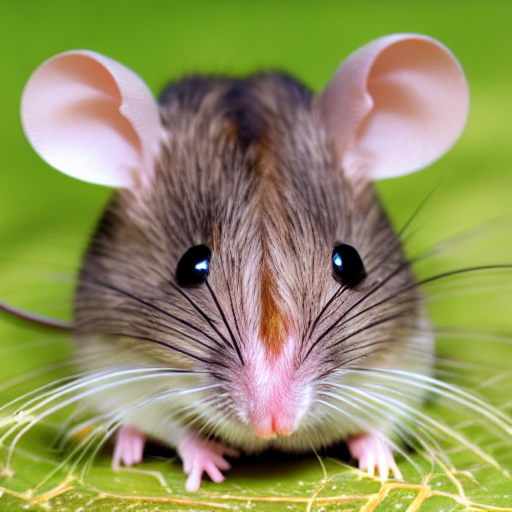

Score for Foreground Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill (No Init Image, No Background Prompt) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.9200000000000002 (96.00)
Average Image Quality (0 to 2) over 50 samples: 1.64 (82.00)



In [7]:
experiment("Background Fill (No Init Image, No Background Prompt)", generated_images, [("Foreground Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Background Fill (With Init Image, No Background Prompt)

In [8]:
num_samples = 50
images = get_random_coco_samples(num_samples=num_samples)
generated_images = []
strength = 0.9
for cat_name, image in tqdm(images):
    image = image_transform(image)
    image = image.unsqueeze(0)
    prompt = f"a photo of a {cat_name}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:13<00:00,  6.26s/it]


Class: a photo of a toaster


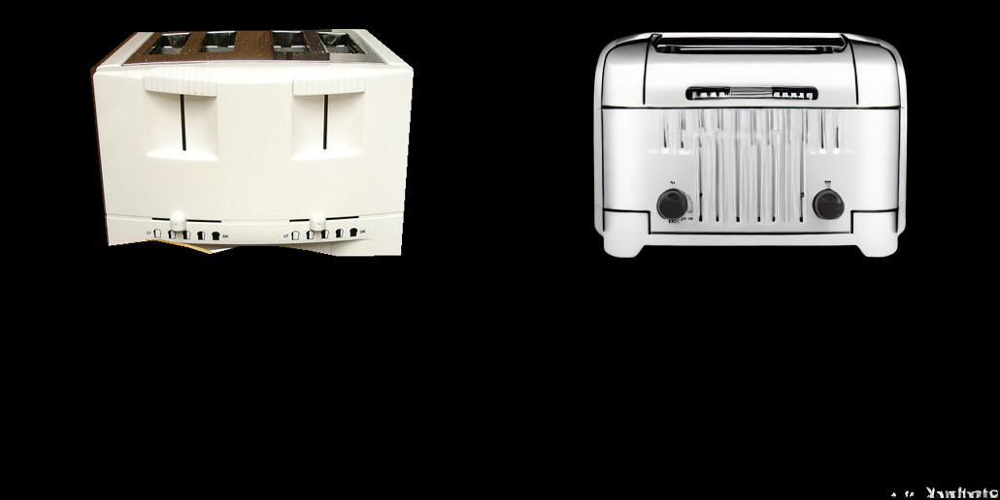

Score for Foreground Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill (With Init Image, No Background Prompt) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.68 (84.00)
Average Image Quality (0 to 2) over 50 samples: 1.62 (81.00)



In [10]:
experiment("Background Fill (With Init Image, No Background Prompt)", generated_images, [("Foreground Accuracy", 0, 2), ("Image Quality", 0, 2)])

Interestingly, blank backgrounds are mostly replicated in the output even at high noise strengths.

## Background Fill (With Init Image, With Background Prompt)

In [6]:
background_prompt_templates = [
    "on grass",
    "on a road",
    "in a forest",
    "in water",
    "indoors",
    "next to a toilet",
    "in snow",
    "with a cat",
    "in rain",
    "at night",
]

In [11]:
num_samples = 50
images = get_random_coco_samples(num_samples=num_samples)
generated_images = []
strength = 0.9
for cat_name, image in tqdm(images):
    image = image_transform(image)
    image = image.unsqueeze(0)
    background_prompt = rng.choice(background_prompt_templates)
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:10<00:00,  6.20s/it]


Class: a photo of a potted plant on a road


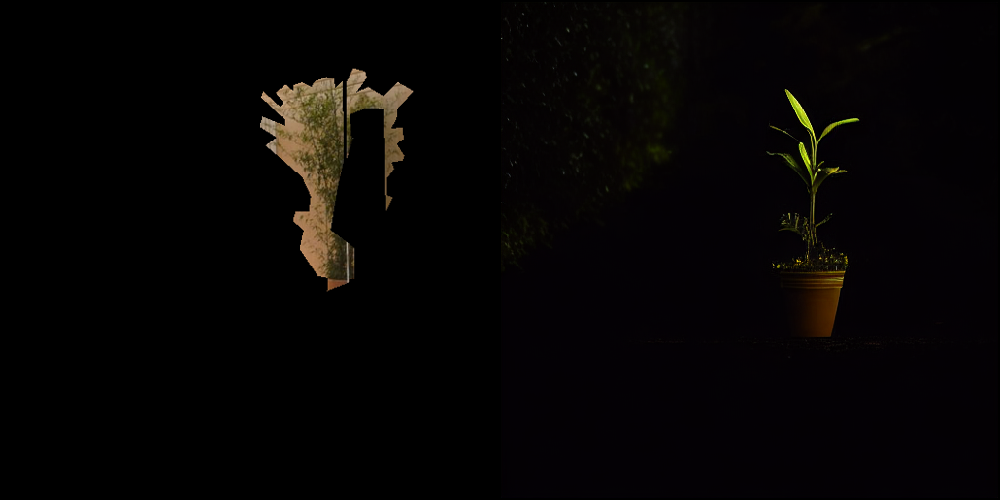

Score for Foreground Accuracy (0 to 2):2
Score for Background Accuracy (0 to 2):0
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill (With Init Image, With Background Prompt) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.6400000000000001 (82.00)
Average Background Accuracy (0 to 2) over 50 samples: 0.82 (41.00)
Average Image Quality (0 to 2) over 50 samples: 1.5399999999999998 (77.00)



In [13]:
experiment("Background Fill (With Init Image, With Background Prompt)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

"at night" works very well due to bias from the init image, suggests using background templates (next experiment). Doesn't understand context ("next to a toilet", "in rain" etc.,) doesn't work that well.

In [7]:
def get_random_coco_samples_on_bgs(backgrounds, num_samples=50, image_size=512):
    images = []
    for i, background in zip(range(num_samples), backgrounds):
        cat_name = rng.choice(coco.cat_names)
        coco.cat = cat_name
        fg, _, mask = coco.get_random()
        bg = Image.open(background)
        image = paste_on_bg(fg, bg, mask, size=image_size)
        images.append((cat_name, image))
        
    return images

def get_random_backgrounds(num_samples, images_folder):
    backgrounds = []
    background_prompts = []
    for i in range(num_samples):
        background_prompt = rng.choice(background_prompt_templates)
        background_prompts.append(background_prompt)
        for subfolder in images_folder.iterdir():
            if subfolder.name in background_prompt:
                backgrounds.append(rng.choice([p for p in subfolder.iterdir() if p.suffix == ".jpeg"]))
    return background_prompts, backgrounds

## Background Fill (With Init Image, With Background Prompt, With Background Init)

In [8]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)    
images = get_random_coco_samples_on_bgs(backgrounds, num_samples=num_samples)

generated_images = []
strength = 0.9
for (cat_name, image), background_prompt in zip(tqdm(images), background_prompts):
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:00<00:00,  6.01s/it]


Class: a photo of a bear next to a toilet


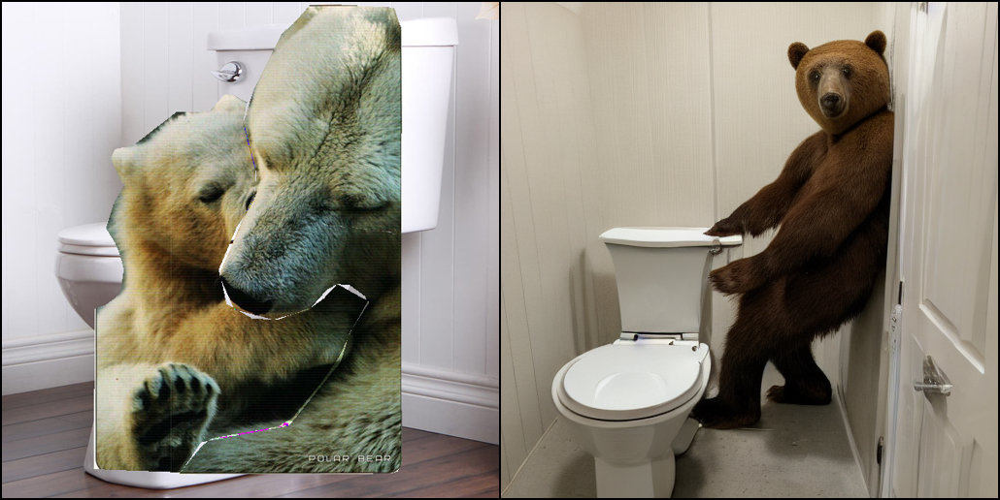

Score for Foreground Accuracy (0 to 2):2
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill (With Init Image, With Background Prompt, With Background Init) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.5999999999999999 (80.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.7999999999999998 (90.00)
Average Image Quality (0 to 2) over 50 samples: 1.8399999999999994 (92.00)



In [10]:
experiment("Background Fill (With Init Image, With Background Prompt, With Background Init)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

size of the foreground seems to matter; larger foreground images -> better reproduction in the output.

## Background Fill on ImageNet (With Init Image, Background Prompt, Background Init)

In [8]:
from torchvision.datasets import ImageNet
imagenet = ImageNet("/cmlscratch/pkattaki/datasets/ILSVRC2012/")
def get_random_imagenet_samples_on_bgs(backgrounds, num_samples=50, image_size=512):
    images = []
    for i, background in zip(range(num_samples), backgrounds):
        fg, label = imagenet[rng.choice(len(imagenet))]
        cat_name = imagenet_classes[label]
        bg = Image.open(background)
        image = paste_on_bg(fg, bg, size=image_size)
        images.append((cat_name, image))
        
    return images

In [9]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)        
images = get_random_imagenet_samples_on_bgs(backgrounds, num_samples=num_samples)

generated_images = []
strength = 0.9
for (cat_name, image), background_prompt in zip(tqdm(images), background_prompts):
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:03<00:00,  6.08s/it]


Class: a photo of a disk brake, disc brake in rain


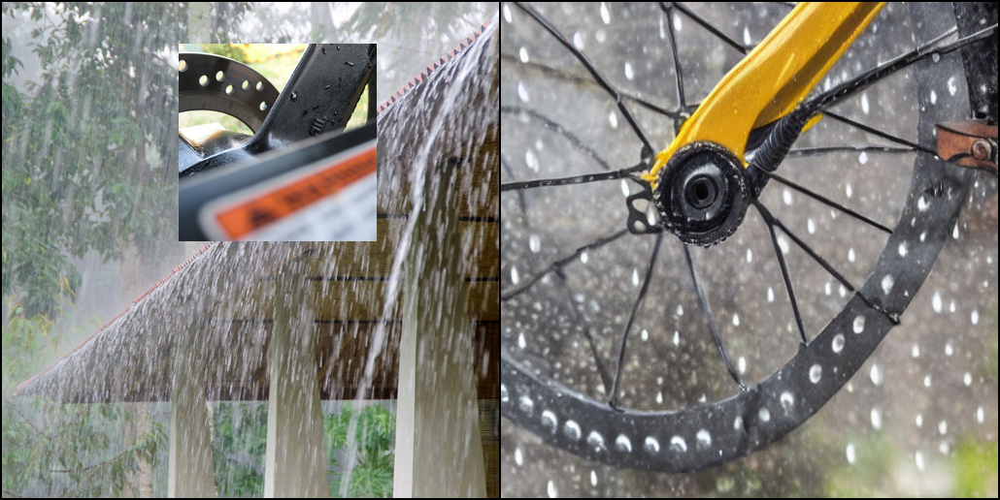

Score for Foreground Accuracy (0 to 2):1
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill on ImageNet (With Init Image, Background Prompt, Background Init) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.6600000000000001 (83.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.4799999999999995 (74.00)
Average Image Quality (0 to 2) over 50 samples: 1.92 (96.00)



In [10]:
experiment("Background Fill on ImageNet (With Init Image, Background Prompt, Background Init)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

Most foreground failures are for ambiguous/obscure classes.

## Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition) (Control)

In [9]:
subset_imagenet_classes = {
    0: "a fresh and brackish water fish",   # tench
    64: "a highly venomous snake of the mamba genus",  # green mamba
    170: "a historic sighthound dog breed from Ireland", # irish wolfhound
    350: "a wild goat, distinguished by the male's large recurved horns", # ibex
    588: "a basket with a carrying handle and a hinged lid, used for food on a picnic", # hamper
    676: "a guard, typically made of straps or wire, fitted over an animal's face to stop it from biting", # muzzle
    669: "a fine net hung across a door or window or around a bed to keep mosquitoes away", # mosquito net
    682: "a stone pillar, typically having a pyramidal top, set up as a monument or landmark", # obelisk
    815: "a web made by a spider", # spider web
    908: "a rigid horizontal structure that projects from both sides of an aircraft and supports it in the air",  # wing
    993: " a genus of fungi", # gyromitra
    999: "paper on a roll for wiping oneself clean after defecation", # toiler paper
}

In [10]:
def get_subset_imagenet_samples_on_bgs(backgrounds, num_samples=50, image_size=512):
    images = []
    for i, background in zip(range(num_samples), backgrounds):
        label = None
        while label not in subset_imagenet_classes:
            fg, label = imagenet[rng.choice(len(imagenet))]
        cat_name = imagenet_classes[label]
        bg = Image.open(background)
        image = paste_on_bg(fg, bg, size=image_size)
        images.append((label, image))
        
    return images

In [22]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)        
images = get_subset_imagenet_samples_on_bgs(backgrounds, num_samples=num_samples)

generated_images = []
strength = 0.9
for (label, image), background_prompt in zip(tqdm(images), background_prompts):
    cat_name = imagenet_classes[label]
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [04:59<00:00,  5.99s/it]


Class: a photo of a spider web, spider's web on grass


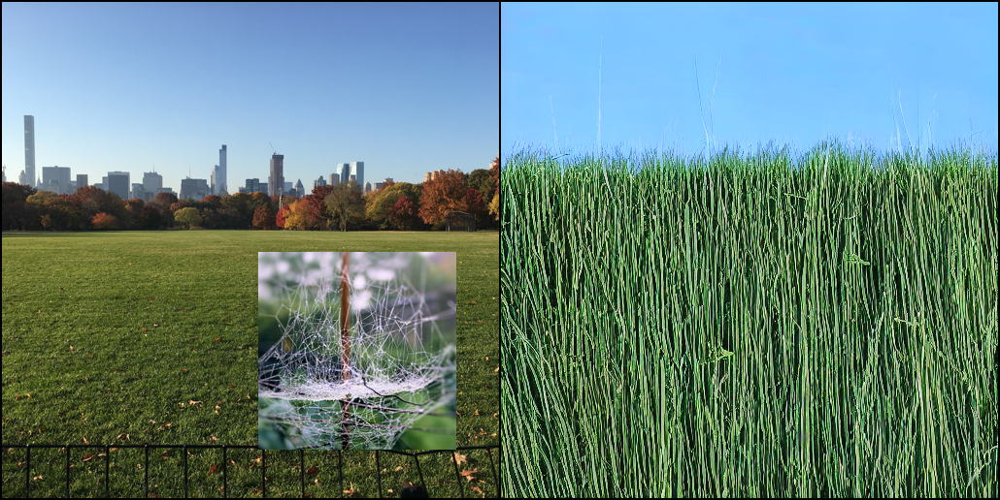

Score for Foreground Accuracy (0 to 2):0
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition) (Control) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.32 (66.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.9399999999999997 (97.00)
Average Image Quality (0 to 2) over 50 samples: 1.9 (95.00)



In [23]:
experiment("Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition) (Control)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition)

In [15]:
num_samples = 50
images_folder = Path("./images/backgrounds/")
1
background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)        
images = get_subset_imagenet_samples_on_bgs(backgrounds, num_samples=num_samples)

generated_images = []
strength = 0.9
for (label, image), background_prompt in zip(tqdm(images), background_prompts):
    cat_name = imagenet_classes[label]
    cat_name = cat_name.split(",")[0]
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name}, {subset_imagenet_classes[label]}, {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [06:16<00:00,  7.53s/it]


Class: a photo of a wing, a rigid horizontal structure that projects from both sides of an aircraft and supports it in the air, in water


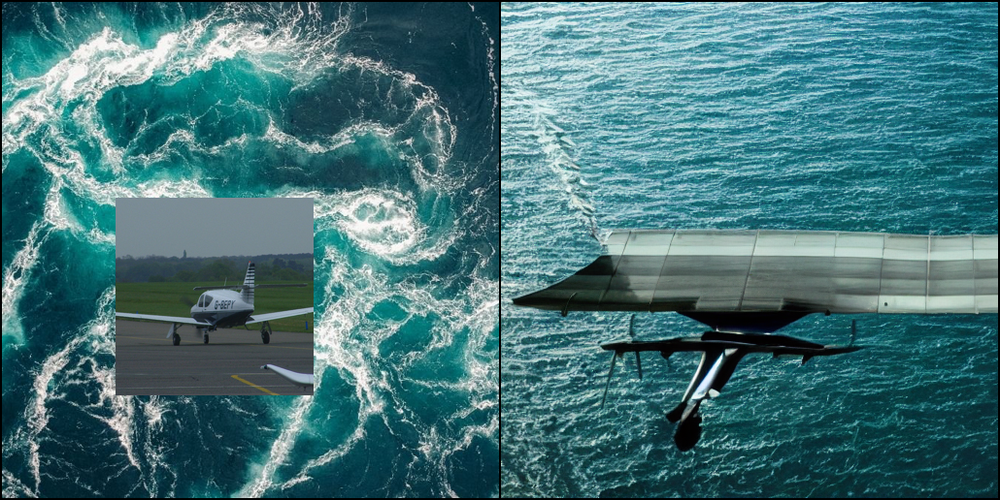

Score for Foreground Accuracy (0 to 2):2
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):1
-----Results-----
Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.7000000000000004 (85.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.4799999999999998 (74.00)
Average Image Quality (0 to 2) over 50 samples: 1.78 (89.00)



In [16]:
experiment("Background Fill on ImageNet (With Init Image, Background Prompt, Background Init, Definition)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Background Fill on ImageNet (No Init Image, Background Prompt)

In [31]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, _ = get_random_backgrounds(num_samples, images_folder)        

generated_images = []
strength = 0.9
for background_prompt in tqdm(background_prompts):
    cat_name = imagenet_classes[rng.choice(list(subset_imagenet_classes.keys()))]
    
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [06:45<00:00,  8.11s/it]


Class: a photo of a tench, Tinca tinca in snow


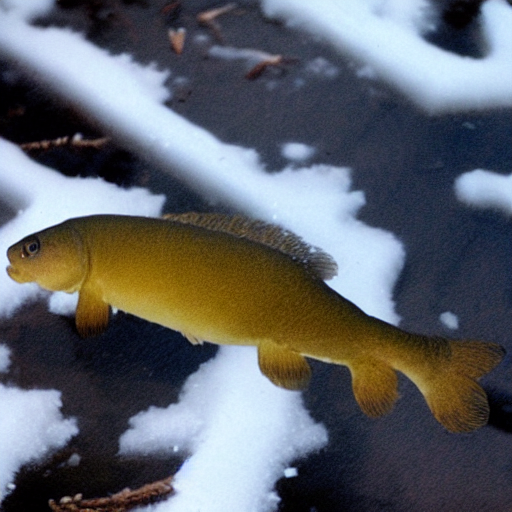

Score for Foreground Accuracy (0 to 2):2
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill on ImageNet (No Init Image, Background Prompt) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.5999999999999999 (80.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.3999999999999995 (70.00)
Average Image Quality (0 to 2) over 50 samples: 1.8200000000000003 (91.00)



In [32]:
experiment("Background Fill on ImageNet (No Init Image, Background Prompt)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Background Fill on ImageNet (No Init Image, Background Prompt, Definition)

In [21]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, _ = get_random_backgrounds(num_samples, images_folder)        

generated_images = []
strength = 0.9
for background_prompt in tqdm(background_prompts):
    label = rng.choice(list(subset_imagenet_classes.keys()))
    cat_name = imagenet_classes[label]
    
    prompt = f"a photo of a {cat_name}, {subset_imagenet_classes[label]}, {background_prompt}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [06:20<00:00,  7.61s/it]


Class: a photo of a mosquito net, a fine net hung across a door or window or around a bed to keep mosquitoes away, in water


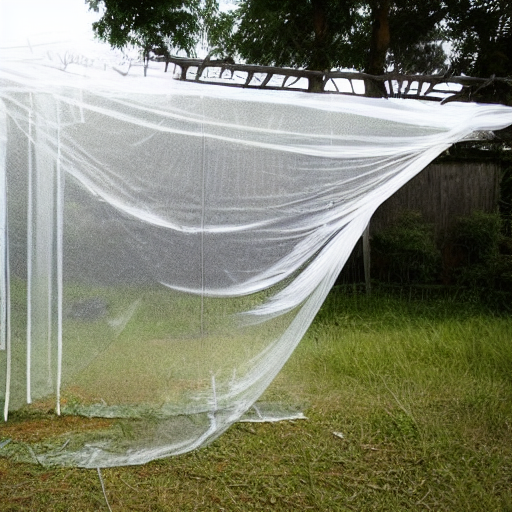

Score for Foreground Accuracy (0 to 2):2
Score for Background Accuracy (0 to 2):0
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill on ImageNet (No Init Image, Background Prompt, Definition) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.9400000000000002 (97.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.18 (59.00)
Average Image Quality (0 to 2) over 50 samples: 1.9 (95.00)



In [22]:
experiment("Background Fill on ImageNet (No Init Image, Background Prompt, Definition)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Background Fill on ImageNet (Background Init Image, Background Prompt, Definition)

In [23]:
num_samples = 50
images_folder = Path("./images/backgrounds/")
1
background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)        

generated_images = []
strength = 0.9
for background, background_prompt in zip(tqdm(backgrounds), background_prompts):
    label = rng.choice(list(subset_imagenet_classes.keys()))
    cat_name = imagenet_classes[label]
    cat_name = cat_name.split(",")[0]
    image = Image.open(background)
    image = T.Resize(512, interpolation=T.InterpolationMode.BICUBIC)(crop_to_squarize(image))
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name}, {subset_imagenet_classes[label]}, {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:51<00:00,  7.03s/it]


Class: a photo of a muzzle, a guard, typically made of straps or wire, fitted over an animal's face to stop it from biting, with a cat


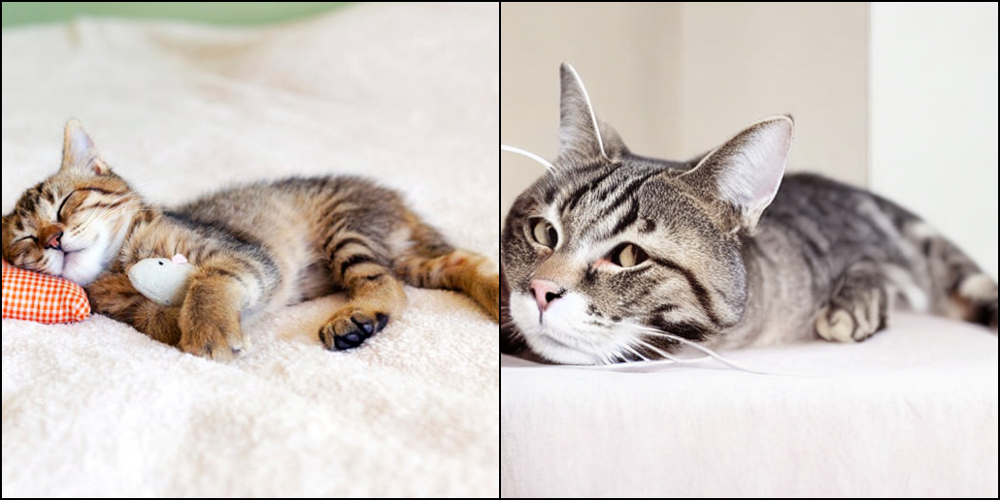

Score for Foreground Accuracy (0 to 2):0
Score for Background Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Background Fill on ImageNet (Background Init Image, Background Prompt, Definition) experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.8199999999999996 (91.00)
Average Background Accuracy (0 to 2) over 50 samples: 1.6 (80.00)
Average Image Quality (0 to 2) over 50 samples: 1.8400000000000003 (92.00)



In [24]:
experiment("Background Fill on ImageNet (Background Init Image, Background Prompt, Definition)", generated_images, [("Foreground Accuracy", 0, 2), ("Background Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Color Shift

In [11]:
colors = [
    "black",
    "white",
    "red",
    "green",
    "blue",
    "cyan",
    "magenta",
    "yellow",
    "pink",
    "purple",
]

In [15]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

generated_images = []
strength = 0.9
for i in trange(num_samples):
    cat_name = imagenet_classes[rng.choice(len(imagenet_classes))]
    color = rng.choice(colors)
    prompt = f"a photo of a {color} {cat_name}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [06:20<00:00,  7.61s/it]


Class: a photo of a black bull mastiff


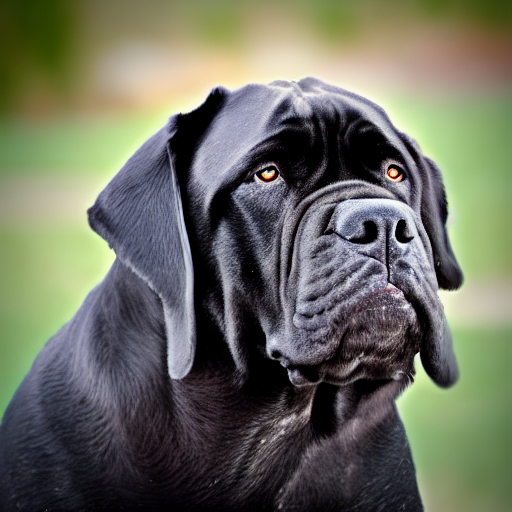

Score for Foreground Accuracy (0 to 2):2
Score for Color Shift? (0 to 1):1
Score for Color Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Color Shift experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.9599999999999997 (98.00)
Average Color Shift? (0 to 1) over 50 samples: 0.8999999999999999 (90.00)
Average Color Accuracy (0 to 2) over 50 samples: 1.5600000000000003 (78.00)
Average Image Quality (0 to 2) over 50 samples: 1.9000000000000004 (95.00)



In [16]:
experiment("Color Shift", generated_images, [("Foreground Accuracy", 0, 2), ("Color Shift?", 0, 1), ("Color Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Render

In [28]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

generated_images = []
strength = 0.9
for i in trange(num_samples):
    cat_name = imagenet_classes[rng.choice(len(imagenet_classes))]
    prompt = f"a low poly render of a {cat_name}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [06:20<00:00,  7.61s/it]


Class: a low poly render of a giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca


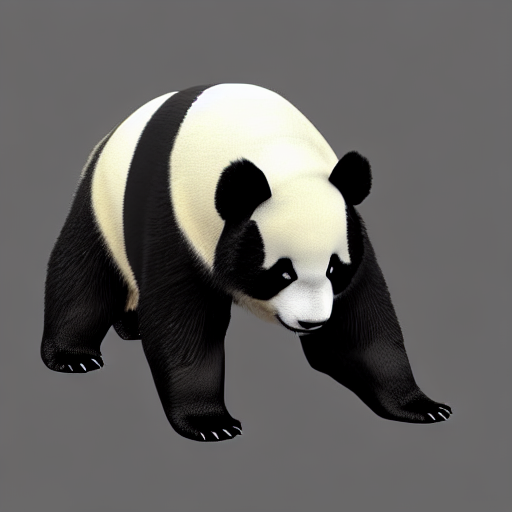

Score for Foreground Accuracy (0 to 2):2
Score for Image Quality (0 to 2):2
-----Results-----
Render experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.9 (95.00)
Average Image Quality (0 to 2) over 50 samples: 1.94 (97.00)



In [29]:
experiment("Render", generated_images, [("Foreground Accuracy", 0, 2), ("Image Quality", 0, 2)])

## Outpainting

In [12]:
def get_random_coco_samples_on_bgs_with_masks(backgrounds, num_samples=50, image_size=512):
    images = []
    for i, background in zip(range(num_samples), backgrounds):
        cat_name = rng.choice(coco.cat_names)
        coco.cat = cat_name
        fg, _, mask = coco.get_random()
        bg = Image.open(background)
        image = paste_on_bg(fg, bg, mask, size=image_size)
        mask = np.squeeze(pad_to_squarize(mask))
        mask = Image.fromarray(mask)
        mask = T.Resize(512, interpolation=T.InterpolationMode.BICUBIC)(mask)
        mask = np.expand_dims(np.array(mask), -1)
        images.append((cat_name, image, mask))
        
    return images

In [12]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

background_prompts, backgrounds = get_random_backgrounds(num_samples, images_folder)    
images = get_random_coco_samples_on_bgs_with_masks(backgrounds, num_samples=num_samples)

generated_images = []
strength = 0.9
for (cat_name, image, mask), background_prompt in zip(tqdm(images), background_prompts):
    image = image_transform(image)
    image = image.unsqueeze(0)
    
    prompt = f"a photo of a {cat_name} {background_prompt}"
    generated_image = diffusion.conditional_generate(prompt, image, strength, mask=mask, ddim_steps=50)
    generated_images.append((prompt, generated_image))

  0%|                                                                                            | 0/50 [00:26<?, ?it/s]


RuntimeError: The size of tensor a (512) must match the size of tensor b (64) at non-singleton dimension 3

## Geography Shift

In [27]:
countries = [
    "Chile",
    "India",
    "Russia",
    "Brazil",
    "Japan",
    "China",
    "Egypt",
    "Saudi Arabia",
    "Ethiopia",
    "Nigeria",
]

In [28]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

generated_images = []
strength = 0.9
for i in trange(num_samples):
    cat_name = imagenet_classes[rng.choice(len(imagenet_classes))]
    country = rng.choice(countries)
    prompt = f"a photo of a {cat_name} in {country}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:54<00:00,  7.09s/it]


Class: a photo a toucan in Egypt


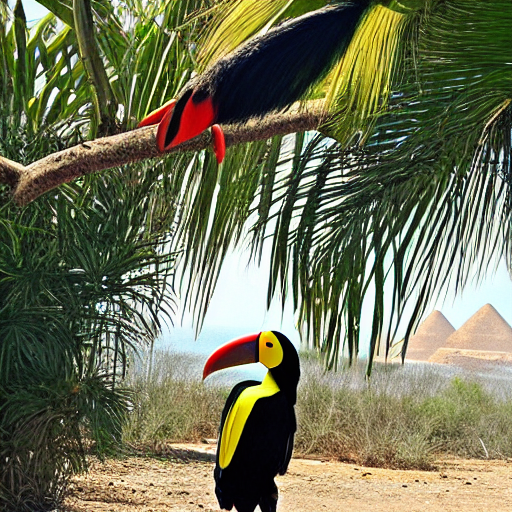

Score for Foreground Accuracy (0 to 2):2
Score for Geography Shift? (0 to 1):1
Score for Image Quality (0 to 2):2
-----Results-----
Geography Shift experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.86 (93.00)
Average Geography Shift? (0 to 1) over 50 samples: 0.6599999999999999 (66.00)
Average Image Quality (0 to 2) over 50 samples: 1.9199999999999995 (96.00)



In [29]:
experiment("Geography Shift", generated_images, [("Foreground Accuracy", 0, 2), ("Geography Shift?", 0, 1), ("Image Quality", 0, 2)])

The generated images have text in other languages, are of generally "low quality". The people also often look like from that country.

## Time Shift

In [37]:
times = [
    1800,
    1850,
    1900,
    1950,
    2000,
    2050,
    2075,
]

In [38]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

generated_images = []
strength = 0.9
for i in trange(num_samples):
    cat_name = imagenet_classes[rng.choice(len(imagenet_classes))]
    time = rng.choice(times)
    if time < 2022:
        prompt = f"an old color photo of a {cat_name} from {time}s"
    else:
        prompt = f"a futuristic color photo of a {cat_name} from {time}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:40<00:00,  6.82s/it]


Class: an old color photo of a abaya from 1800s


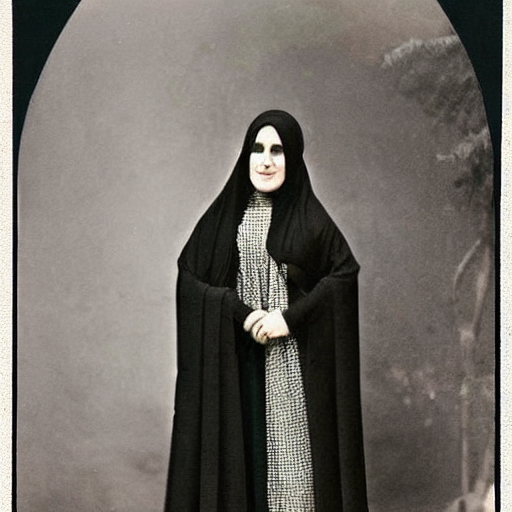

Score for Foreground Accuracy (0 to 2):2
Score for Time Shift? (0 to 1):1
Score for Image Quality (0 to 2):2
-----Results-----
Time Shift experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.88 (94.00)
Average Time Shift? (0 to 1) over 50 samples: 0.8399999999999999 (84.00)
Average Image Quality (0 to 2) over 50 samples: 1.9400000000000002 (97.00)



In [39]:
experiment("Time Shift", generated_images, [("Foreground Accuracy", 0, 2), ("Time Shift?", 0, 1), ("Image Quality", 0, 2)])

## Material Shift

In [42]:
materials = [
    "stone",
    "metallic",
    "chocolate",
    "sand",
    "wooden",
    "ceramic",
    "glass",
    "ice",
]

In [43]:
num_samples = 50
images_folder = Path("./images/backgrounds/")

generated_images = []
strength = 0.9
for i in trange(num_samples):
    cat_name = imagenet_classes[rng.choice(len(imagenet_classes))]
    material = rng.choice(materials)
    prompt = f"a {material} sculpture of a {cat_name}"
    generated_image = diffusion.unconditional_generate(prompt, ddim_steps=50)
    generated_images.append((prompt, generated_image))

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [05:41<00:00,  6.83s/it]


Class: a wooden sculpture of a apiary, bee house


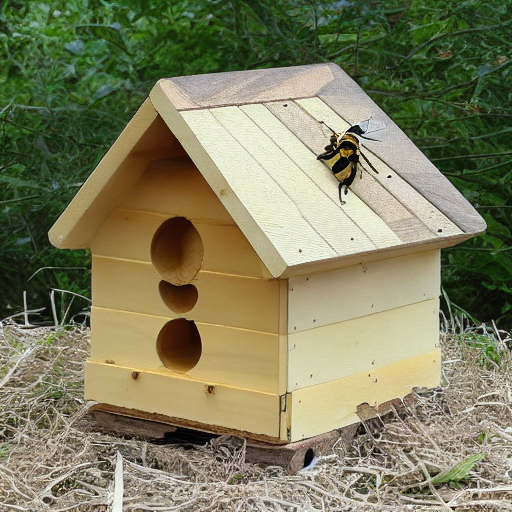

Score for Foreground Accuracy (0 to 2):2
Score for Material Shift? (0 to 1):1
Score for Image Quality (0 to 2):2
-----Results-----
Material Shift experiment
Average Foreground Accuracy (0 to 2) over 50 samples: 1.5800000000000003 (79.00)
Average Material Shift? (0 to 1) over 50 samples: 0.9399999999999997 (94.00)
Average Image Quality (0 to 2) over 50 samples: 1.9000000000000001 (95.00)



In [44]:
experiment("Material Shift", generated_images, [("Foreground Accuracy", 0, 2), ("Material Shift?", 0, 1), ("Image Quality", 0, 2)])

Is a metallic sculpture of toilet paper still toilet paper?

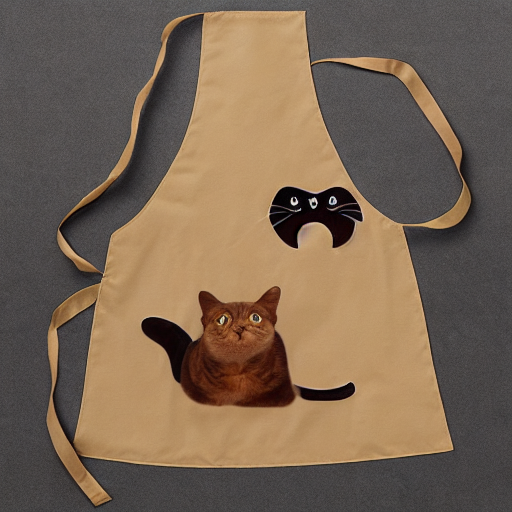

In [51]:
diffusion.unconditional_generate("a photo of a cat shaped apron", ddim_steps=50)

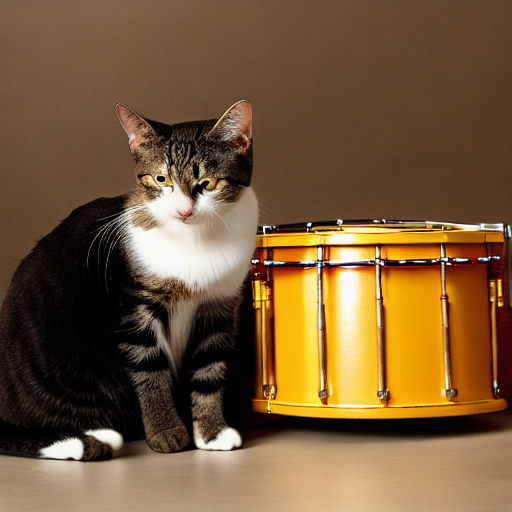

In [54]:
diffusion.unconditional_generate("a photo of a cat and a drum", ddim_steps=50)

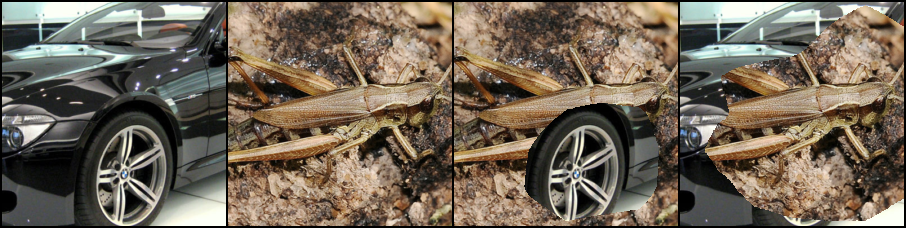

In [47]:
from copy import deepcopy
class_idx = 511
dataset = SalientImageNet(class_idx, core_features_dict[class_idx])
image_1, mask_1 = dataset[0]

class_idx = 311
dataset = SalientImageNet(class_idx, core_features_dict[class_idx])
image_2, mask_2 = dataset[0]

# image_12 = image_1 * mask_1 + (1 - mask_1) * image_2
# image_21 = image_2 * mask_2 + (1 - mask_2) * image_1

image_12 = deepcopy(image_2)
image_21 = deepcopy(image_1)

threshold = 0.6

mask_1 = mask_1.repeat(3, 1, 1)
mask_2 = mask_2.repeat(3, 1, 1)
image_12[mask_1 > threshold] = image_1[mask_1 > 0.6]
image_21[mask_2 > 0.6] = image_2[mask_2 > 0.6]


images = [image_1, image_2, image_12, image_21]

display(T.ToPILImage()(make_grid(images)))

image_12 = T.Resize(512, interpolation=T.InterpolationMode.BICUBIC)(T.ToPILImage()(image_12))
image_21 = T.Resize(512, interpolation=T.InterpolationMode.BICUBIC)(T.ToPILImage()(image_21))

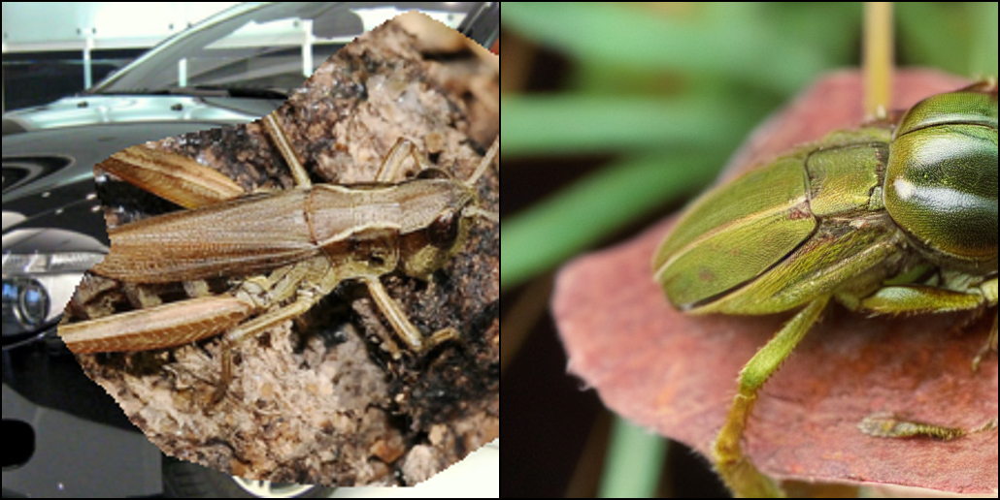

In [48]:
output = diffusion.conditional_generate("a photo of a grass hopper", image_transform(image_21).unsqueeze(0), 0.9)
display(output)

In [7]:
test_images = []
strength = 0.9
for i in range(1, 4):
    test = Image.open(f"./images/mazda/test{i}.jpg")
    test = T.Resize(512, interpolation=T.InterpolationMode.BICUBIC)(test)
    test = image_transform(test).unsqueeze(0)
    output = diffusion.conditional_generate("", test, strength)
    test_images.append(output)

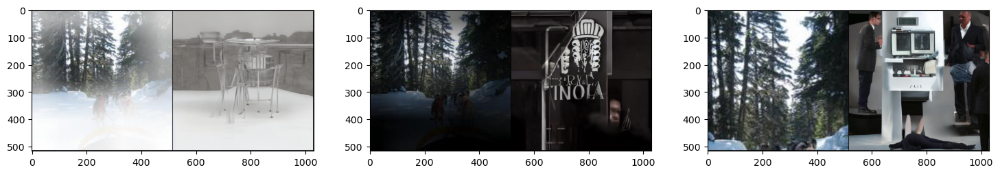

In [9]:
import matplotlib.pyplot as plt
_, axs = plt.subplots(1, 3, figsize=(18, 6))
for i in range(3):
    axs[i].imshow(test_images[i])
plt.show()